In [1]:
!pip uninstall Cython -y

Found existing installation: Cython 3.0.8
Uninstalling Cython-3.0.8:
  Successfully uninstalled Cython-3.0.8


In [2]:
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4107, done.
remote: Counting objects: 100% (4107/4107), done.
remote: Compressing objects: 100% (3109/3109), done.
remote: Total 4107 (delta 1188), reused 2033 (delta 936), pack-reused 0
Receiving objects: 100% (4107/4107), 45.35 MiB | 37.76 MiB/s, done.
Resolving deltas: 100% (1188/1188), done.


In [4]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

In [5]:
import re
with open('/kaggle/working/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/kaggle/working/models/research/setup.py', 'w') as f:
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.8.0', s)
    f.write(s)

In [6]:
!cat /kaggle/working/models/research/setup.py

"""Setup script for object_detection with TF2.0."""
import os
from setuptools import find_packages
from setuptools import setup

REQUIRED_PACKAGES = [
    # Required for apache-beam with PY3
    'avro-python3',
    'apache-beam',
    'pillow',
    'lxml',
    'matplotlib',
    'Cython',
    'contextlib2',
    'tf-slim',
    'six',
    'pycocotools',
    'lvis',
    'scipy',
    'pandas',
    'tf-models-official==2.8.0',
    'tensorflow_io',
    'keras',
    'pyparsing==2.4.7',  # TODO(b/204103388)
    'sacrebleu<=2.2.0'  # https://github.com/mjpost/sacrebleu/issues/209
]

setup(
    name='object_detection',
    version='0.1',
    install_requires=REQUIRED_PACKAGES,
    include_package_data=True,
    packages=(
        [p for p in find_packages() if p.startswith('object_detection')] +
        find_packages(where=os.path.join('.', 'slim'))),
    package_dir={
        'datasets': os.path.join('slim', 'datasets'),
        'nets': os.path.join('slim', 'nets'),
        'preprocessing': os.pa

In [7]:
!pip install pyyaml==5.3
!pip install /kaggle/working/models/research/
!pip install tensorflow==2.8.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.2/268.2 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.3-cp310-cp310-linux_x86_64.whl size=44244 sha256=14d576ee062ce9f911cb9261c645c255da90fb02cccd2487ca07ffd202ca8595
  Stored in directory: /root/.cache/pip/wheels/0d/72/68/a263cfc14175636cf26bada99f13b735be1b60a11318e08bfc
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2024.5.2 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
distributed 2024.1.1 requires dask==2024.1.1, but you have dask 2024.5.2 which is incompatible.
distributed 2024.1.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is

In [8]:
!pip uninstall -y protobuf
!pip install protobuf==3.20.3

Found existing installation: protobuf 3.19.6
Uninstalling protobuf-3.19.6:
  Successfully uninstalled protobuf-3.19.6
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.1 MB/s eta 0:00:0000:01
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.24.4
    Uninstalling protobuf-4.24.4:
      Successfully uninstalled protobuf-4.24.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 24.4.1 requires cubinlinker, which is not installed.
cudf 24.4.1 requires cupy-cuda11x>=12.0.0, which is not installed.
cudf 24.4.1 requires ptxcompiler, which is not installed.
cuml 24.4.0 requires cupy-cuda11x>=12.0.0, which is not installed.
dask-cudf 24.4.1 requires cupy-cuda11x>=12.0.0, which is not installed.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
cudf 24.4.1 requires cuda-python<12.0a0,>=11.7.1, but you have

In [9]:
!python /kaggle/working/models/research/object_detection/builders/model_builder_tf2_test.py

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl7strings6StrCatB5cxx11ERKNS0_8AlphaNumES3_']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data15DatasetOpKernel11TraceStringB5cxx11ERKNS_15O

In [12]:
# List of names
names = [
    "Ayam",
    "Bawang Merah",
    "Bawang Putih",
    "Cabai Hijau",
    "Cabai Merah",
    "Daging Sapi",
    "Ikan",
    "Nasi",
    "Tahu",
    "Telur",
    "Tempe",
    "Tomat",
    "Wortel"
]

# Write to file
with open("/kaggle/working/labelmap.txt", "w") as file:
    for name in names:
        file.write(f"{name}\n")

In [14]:
train_tfrecord_fname = '/kaggle/input/tfrecord-bahan-makanan/Ingridients_Detection.v1i.tfrecord/train/Ingridients_Detection.tfrecord'
val_tfrecord_fname = '/kaggle/input/tfrecord-bahan-makanan/Ingridients_Detection.v1i.tfrecord/valid/Ingridients_Detection.tfrecord'
labelmap_pbtxt_fname = '/kaggle/input/tfrecord-bahan-makanan/Ingridients_Detection.v1i.tfrecord/train/Ingridients_Detection_label_map.pbtxt'

In [15]:
model_name = 'ssd_mobilenet_v2_320x320_coco17_tpu-8'
pretrained_checkpoint = 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz'
base_pipeline_file = 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config'

In [16]:
%mkdir /kaggle/working/models/mymodel/
%cd /kaggle/working/models/mymodel/

import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/kaggle/working/models/mymodel
--2024-06-16 13:14:28--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.99.207, 74.125.195.207, 142.250.107.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.99.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46042990 (44M) [application/x-tar]
Saving to: 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz'

ssd_mobilenet_v2_32 100%[===================>]  43.91M   119MB/s    in 0.4s    

2024-06-16 13:14:29 (119 MB/s) - 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz' saved [46042990/46042990]

--2024-06-16 13:14:30--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.1

In [17]:
batch_size = 128
num_steps = 2000
# num_eval_steps = 50

In [18]:
pipeline_fname = '/kaggle/working/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/kaggle/working/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(labelmap_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 13


In [19]:
import re

%cd /kaggle/working/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_tfrecord_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_tfrecord_fname), s)

    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(labelmap_pbtxt_fname), s)

    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    s = re.sub('learning_rate_base: .8','learning_rate_base: .08', s)

    s = re.sub('warmup_learning_rate: 0.13333','warmup_learning_rate: .02666', s)

    f.write(s)


/kaggle/working/models/mymodel
writing custom configuration file


In [20]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/kaggle/working/models/mymodel/pipeline_file.config'
model_dir = '/kaggle/working/training/'

In [21]:
!cat /kaggle/working/models/mymodel/pipeline_file.config

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


# SSD with Mobilenet v2
# Trained on COCO17, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 13
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      ssd_anchor_generator {
        num_layers: 6
        min_scale: 0.2
        max_scale: 0.95
        aspect_ratios: 1.0
        aspect_ratios: 2.0
        aspect_ratios: 0.5
        aspect_ratios: 3.0


In [22]:
# Run training!
!python /kaggle/working/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 
#   --num_eval_steps={num_eval_steps}

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl7strings6StrCatB5cxx11ERKNS0_8AlphaNumES3_']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data15DatasetOpKernel11TraceStringB5cxx11ERKNS_15O

In [23]:
import os
print(os.getcwd())
%load_ext tensorboard
%tensorboard --logdir '/kaggle/working/training/train'

/kaggle/working/models/mymodel


In [24]:
!mkdir /kaggle/working/custom_model_lite
output_dir = '/kaggle/working/custom_model_lite'

last_model_path = '/kaggle/working/training'

!python /kaggle/working/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_dir} \
    --pipeline_config_path {pipeline_file}


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl7strings6StrCatB5cxx11ERKNS0_8AlphaNumES3_']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data15DatasetOpKernel11TraceStringB5cxx11ERKNS_15O

In [25]:
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/kaggle/working/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/kaggle/working/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

In [26]:
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=1, savepath='/kaggle/working/results', txt_only=False):

  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  images_to_test = random.sample(images, num_test_images)

  for image_path in images_to_test:

      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      if txt_only == False:
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      elif txt_only == True:

        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


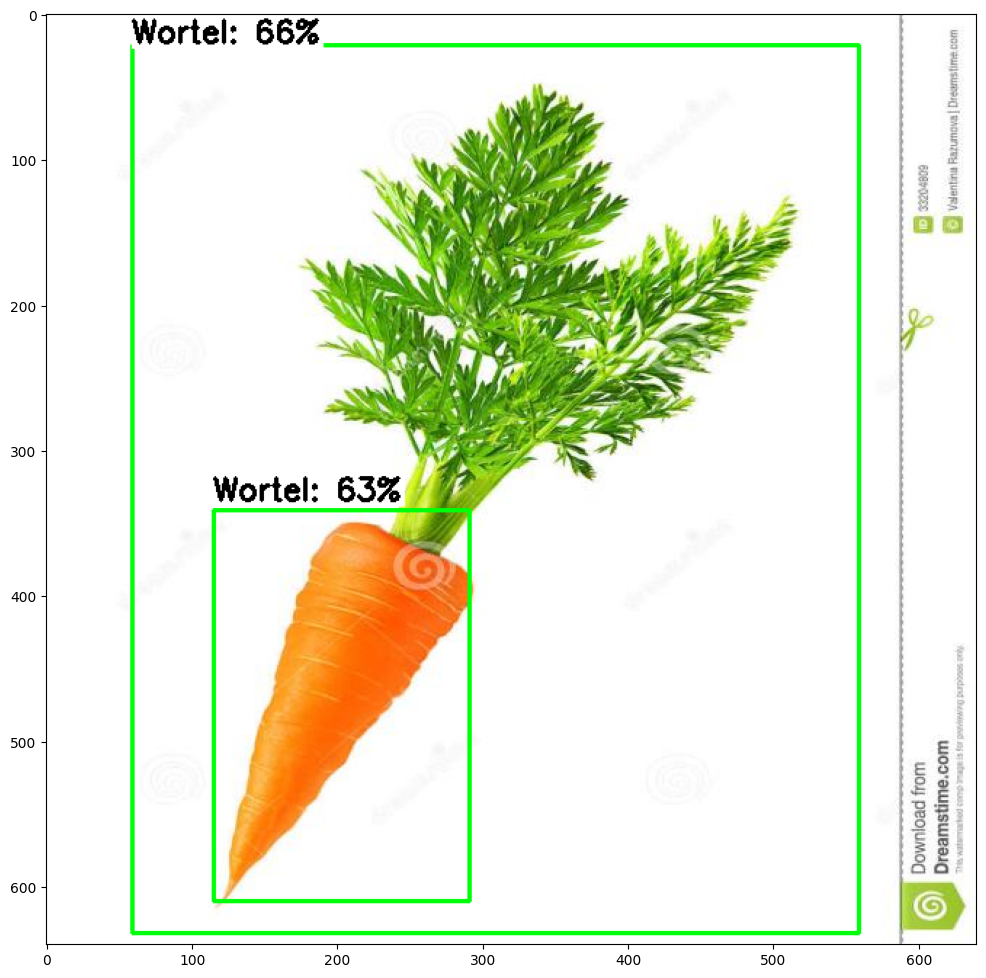

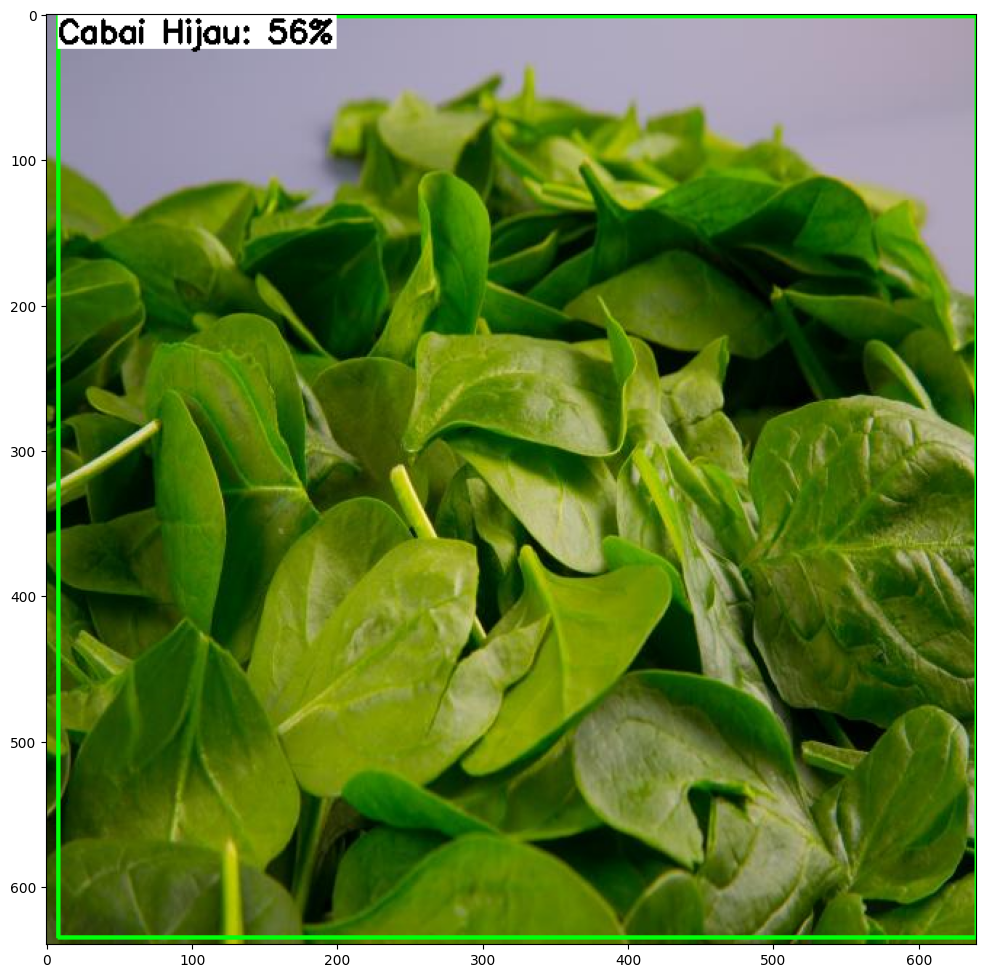

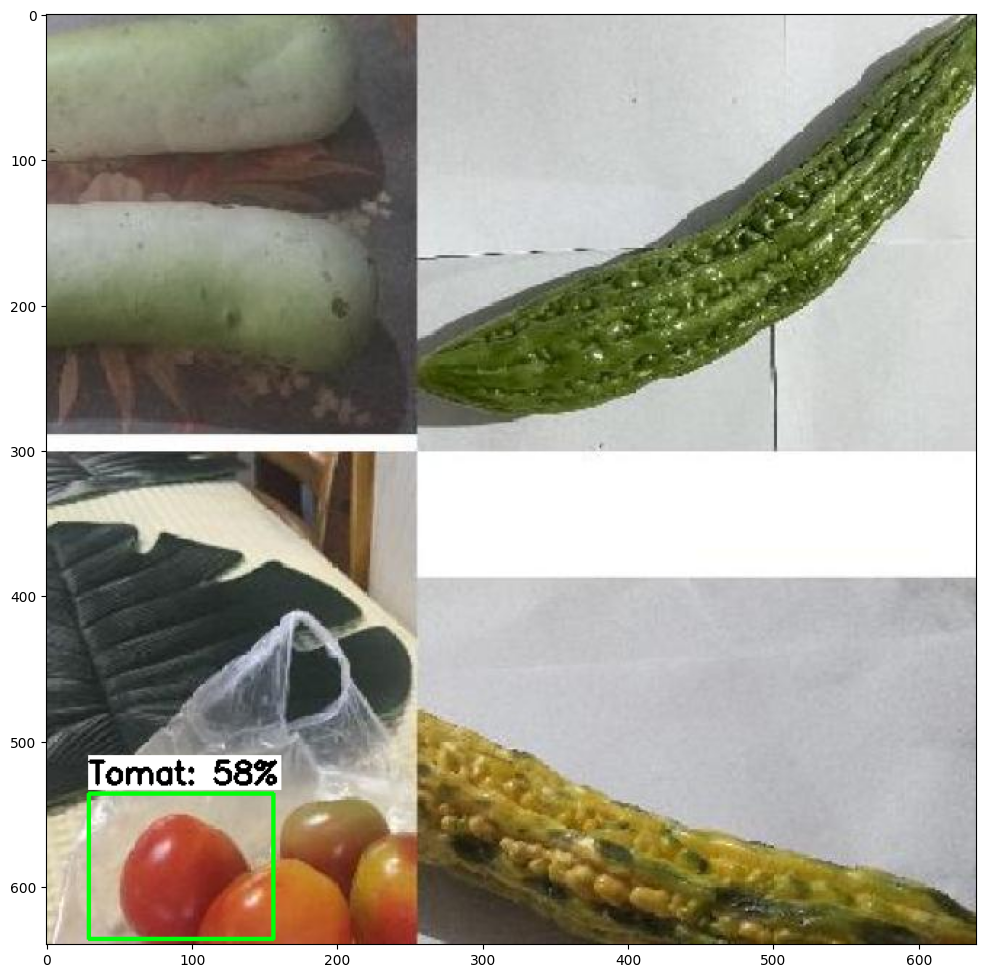

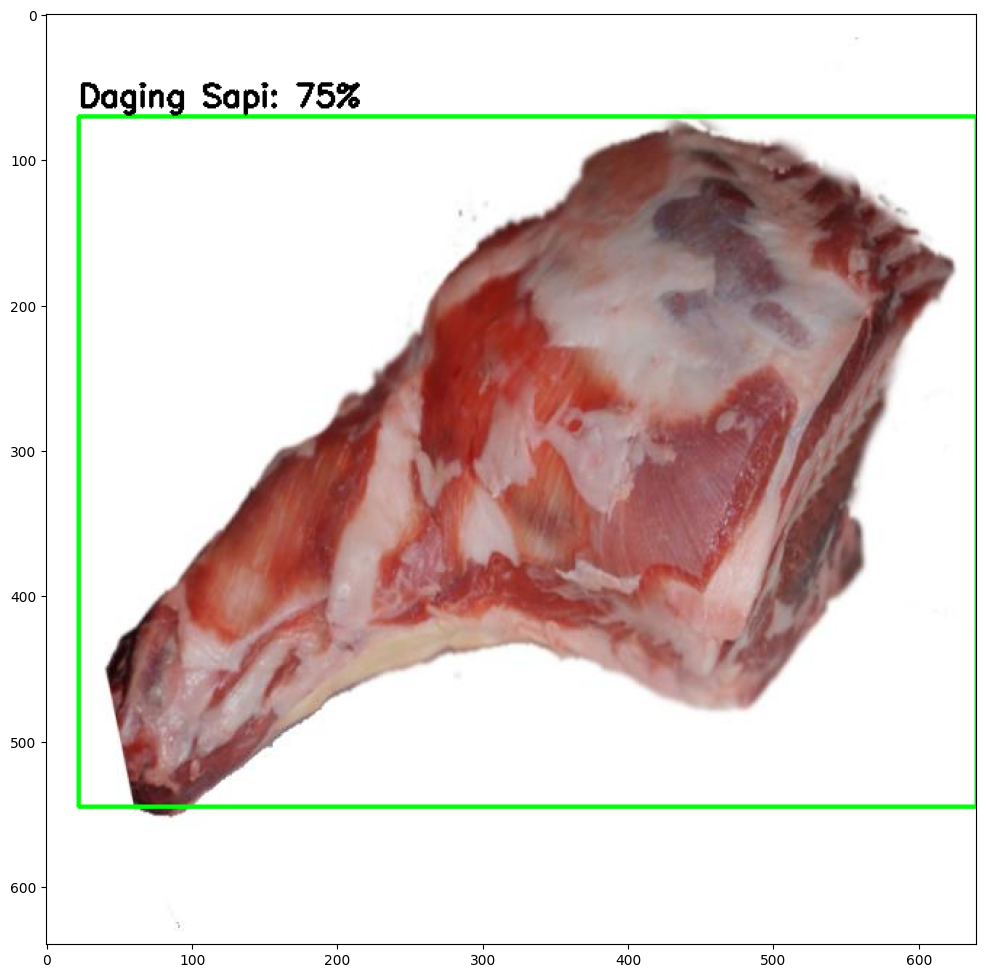

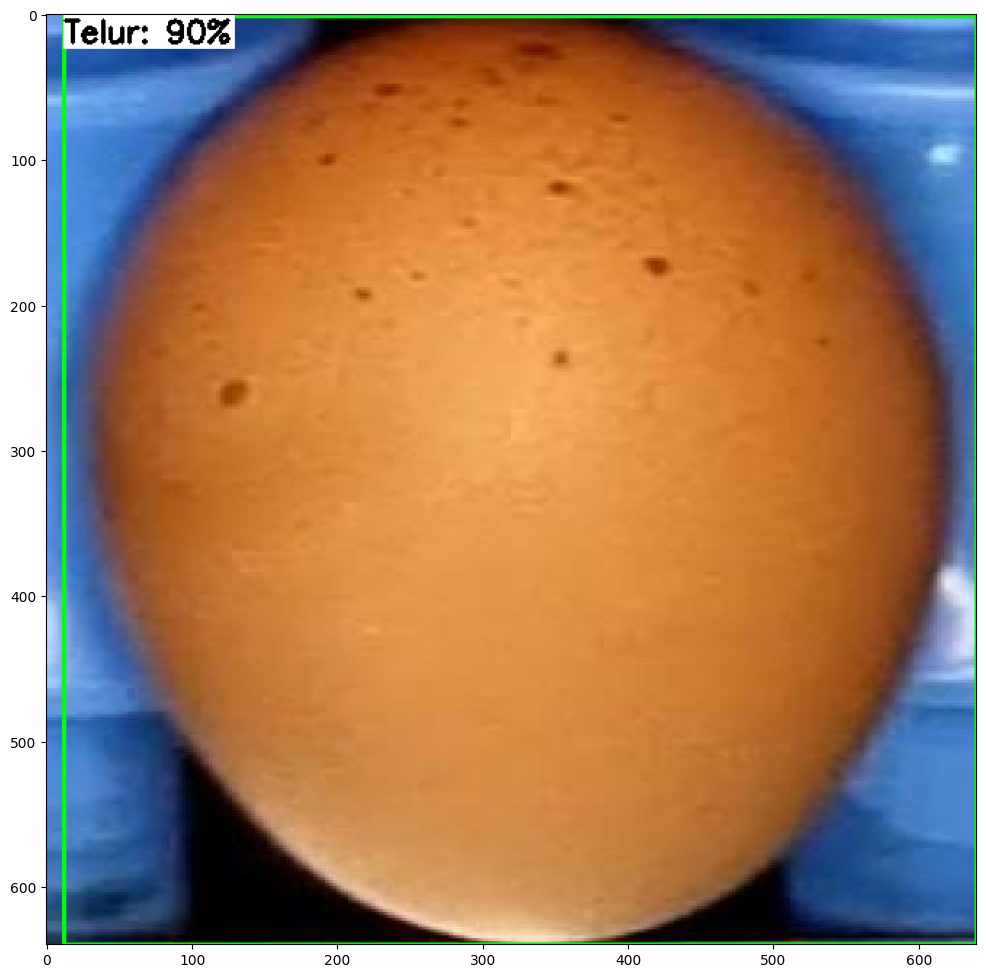

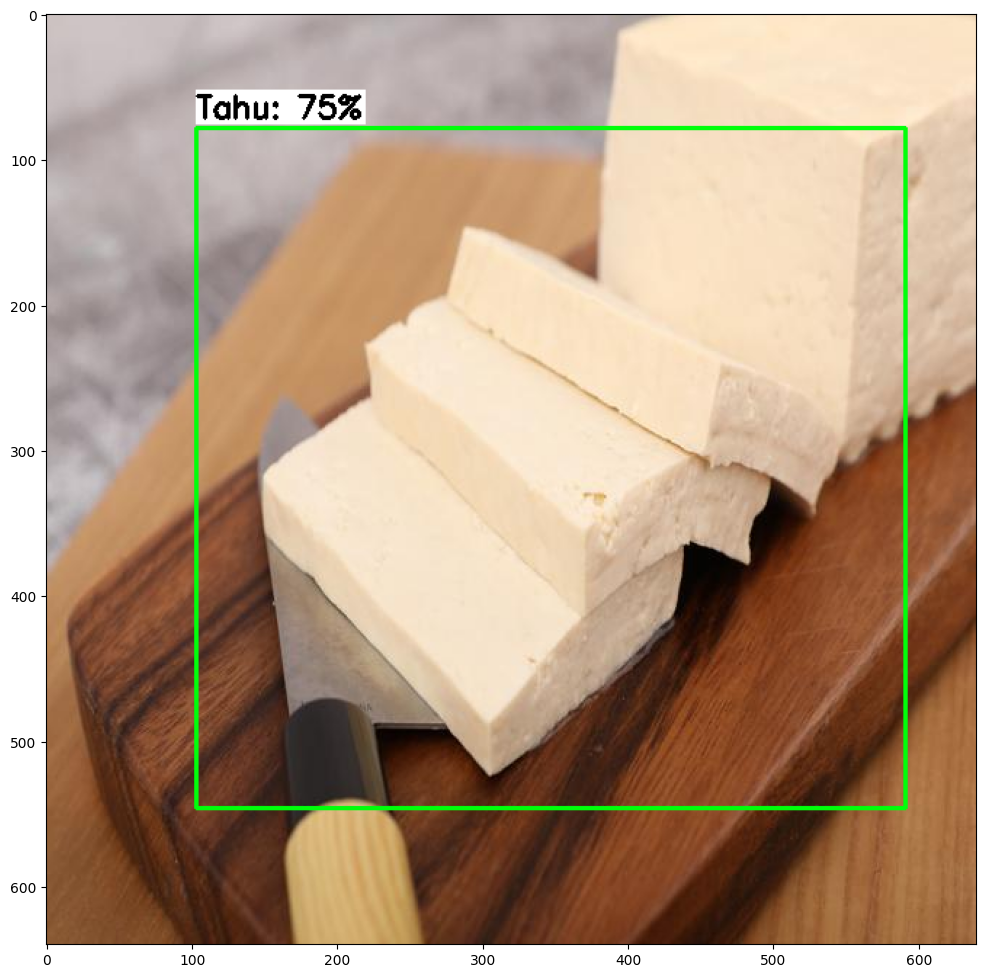

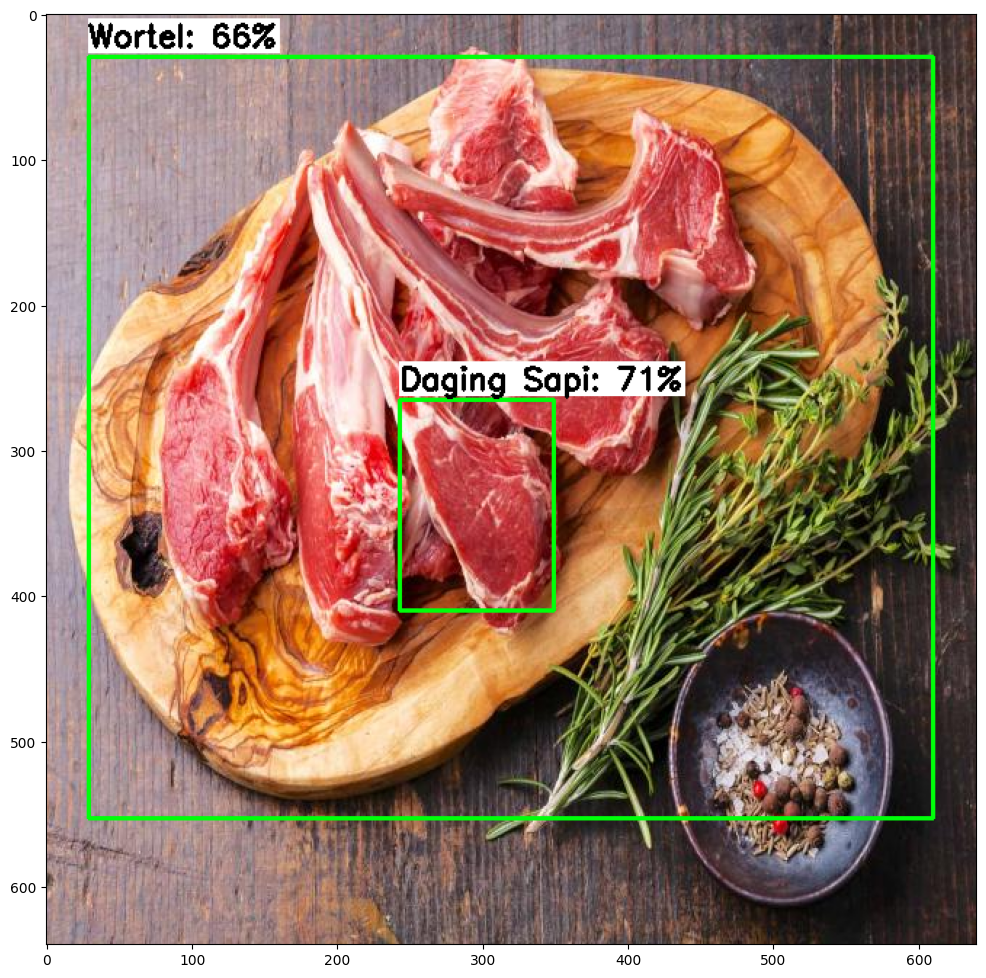

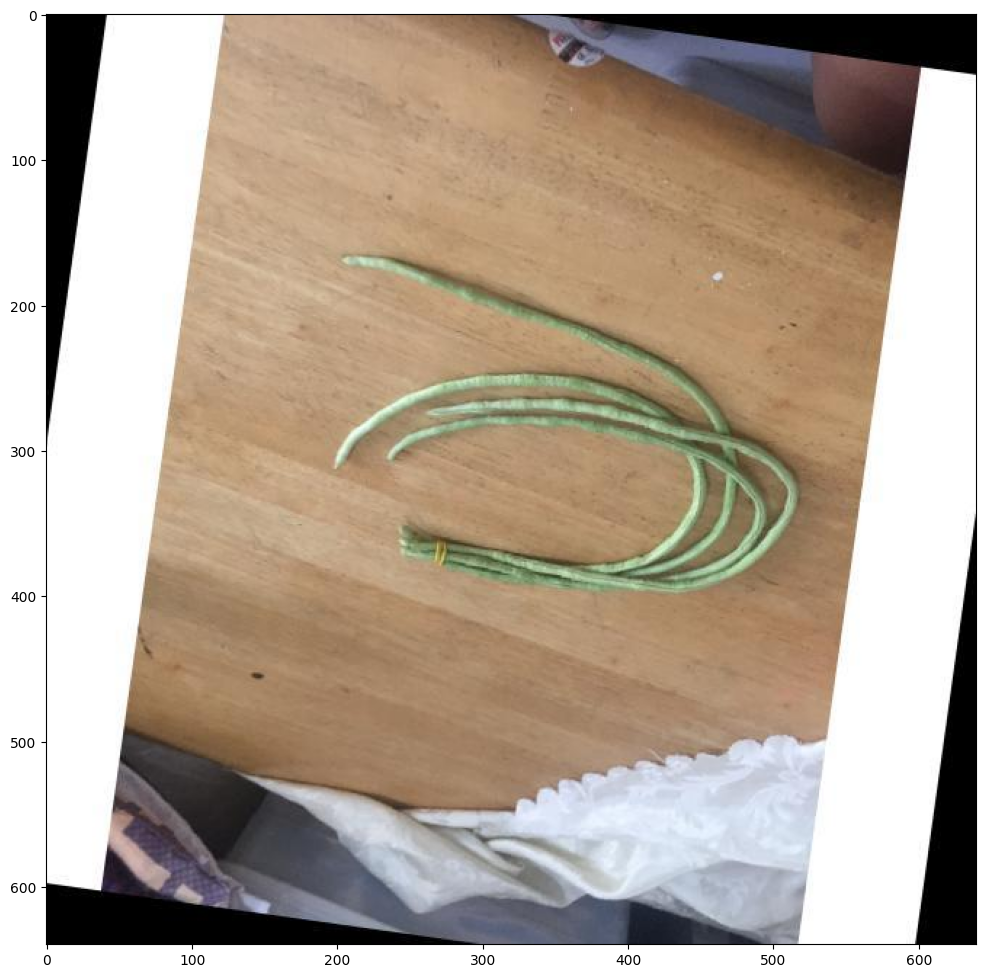

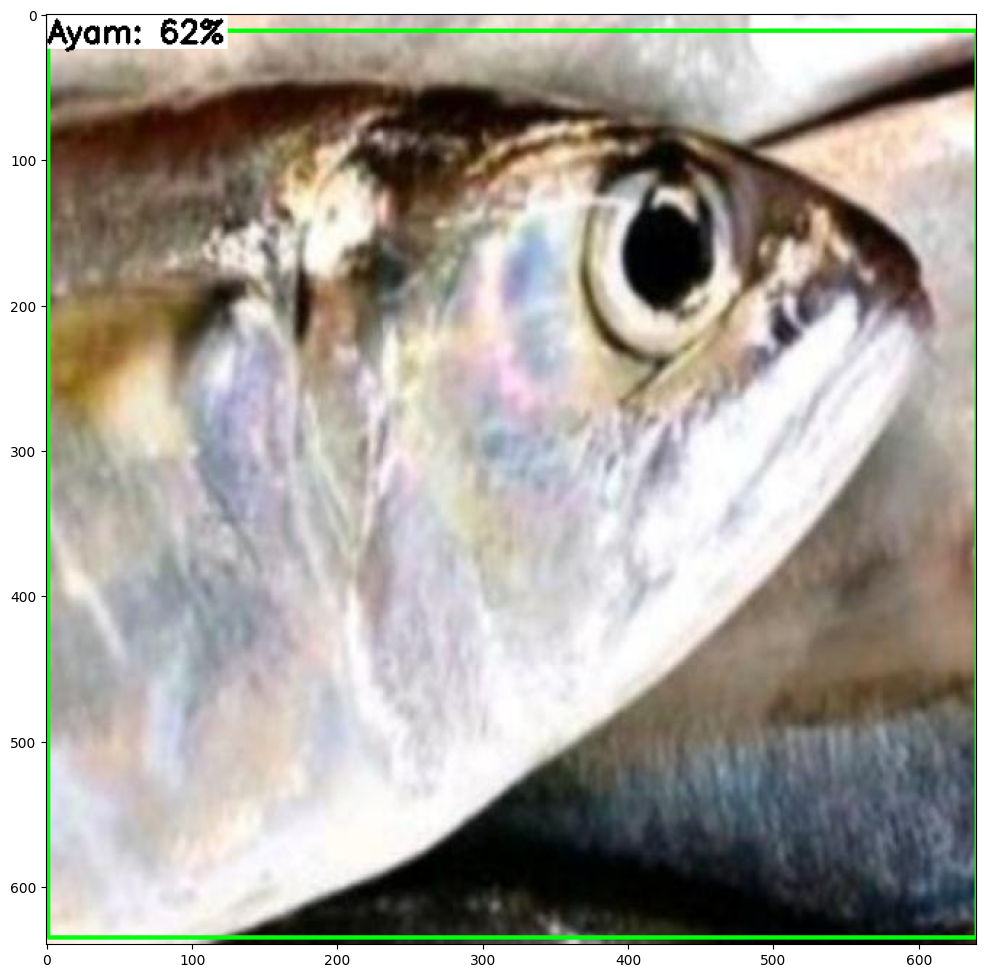

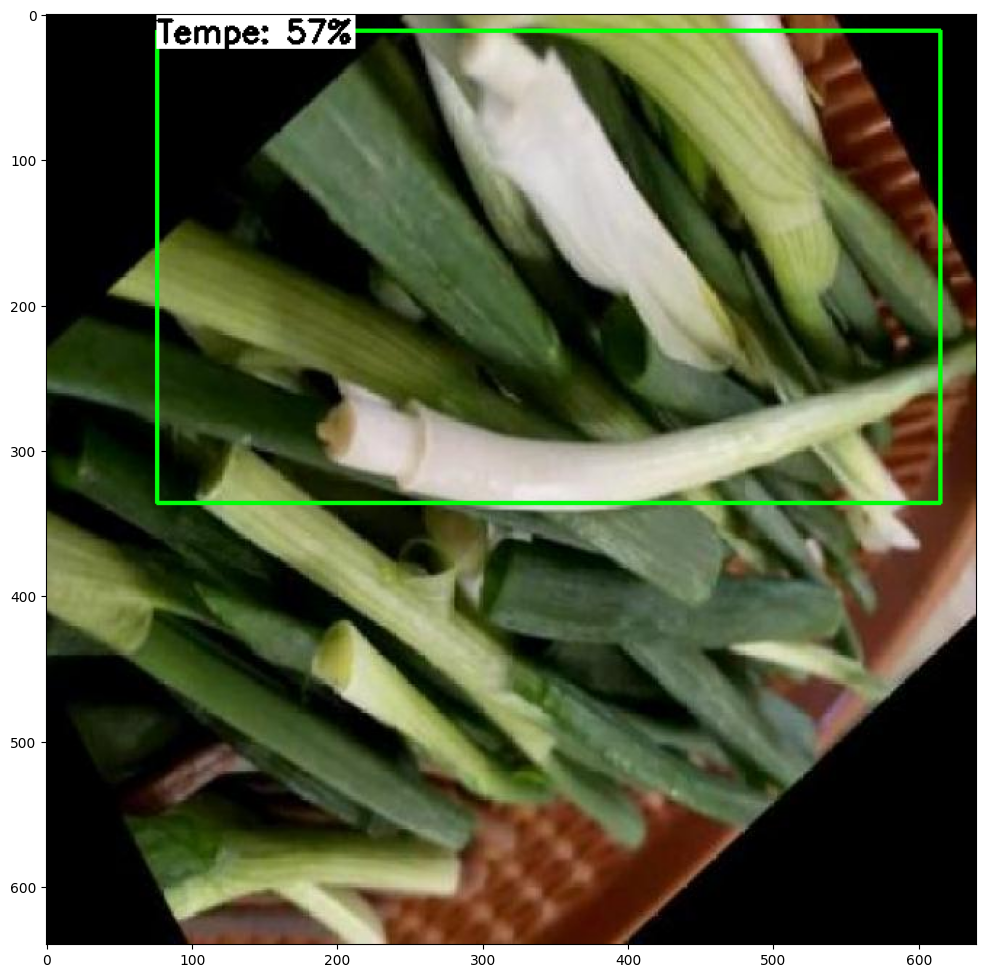

In [27]:
# Set up variables for running user's model
PATH_TO_IMAGES='/kaggle/input/dataset-bahan-makanan/test/'
PATH_TO_MODEL='/kaggle/working/custom_model_lite/detect.tflite'
PATH_TO_LABELS='/kaggle/working/labelmap.txt'
min_conf_threshold=0.5
images_to_test = 10

tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)